In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")


In [2]:
#!wget -r https://cdn.otus.ru/media/public/69/cd/winequality_white_109924_15b29b-85740-69cd48.csv

In [3]:
#data = pd.read_csv('/content/cdn.otus.ru/media/public/69/cd/winequality_white_109924_15b29b-85740-69cd48.csv', sep=';')
data = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv', sep = ';')
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [5]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


#EDA

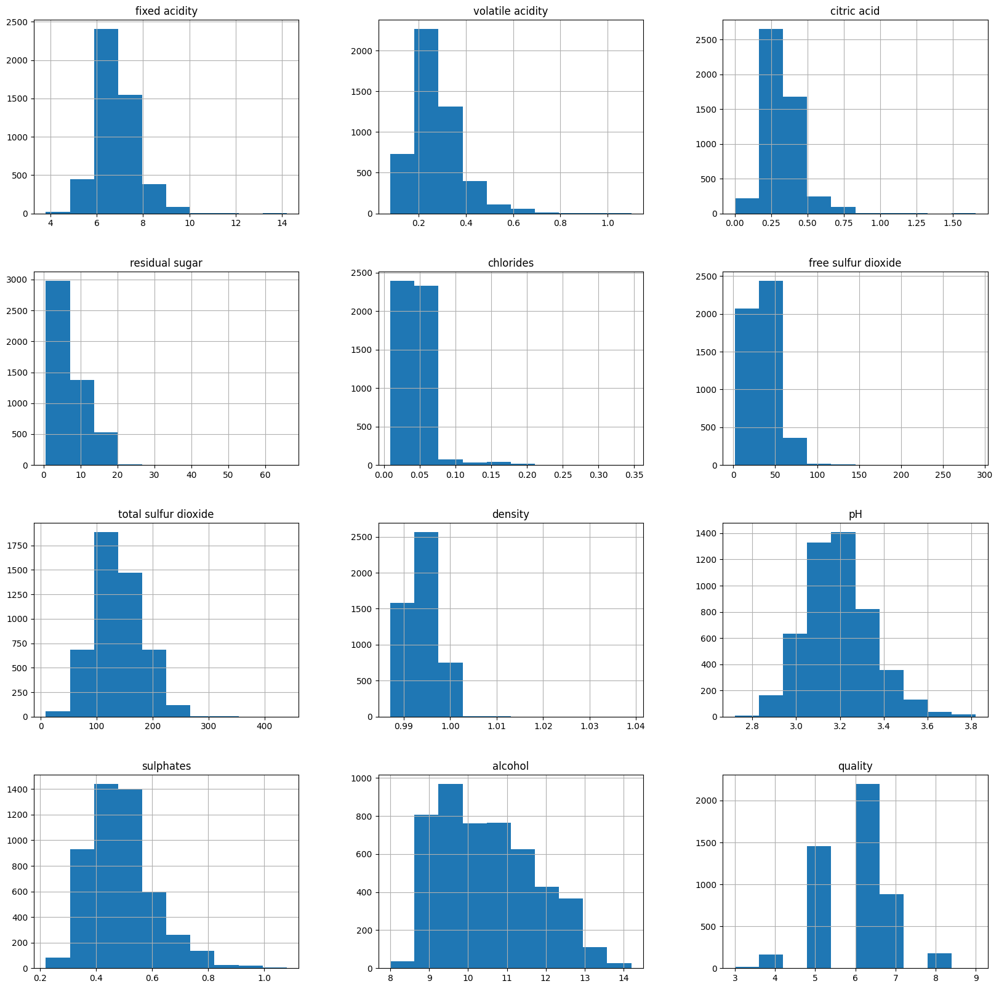

In [6]:
data.hist(figsize=(20, 20));

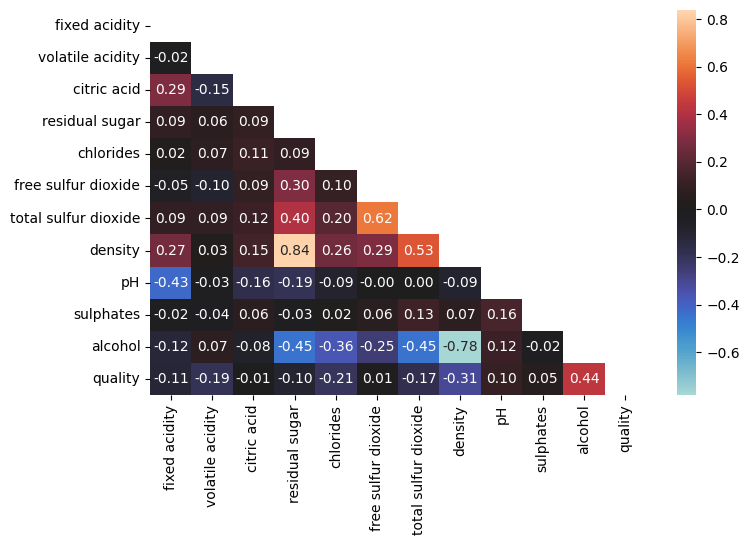

In [7]:
plt.figure(figsize=(8,5))

corr_matrix = data.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=True, center=0);

In [8]:
# оставим только признаки, имеющие высокие коэффициенты парной корреляции Пирсона
high_corr = [
     column for column in lower.columns
     if any((lower[column] > 0.6)|(lower[column] < -0.6))
     ]
high_corr

['residual sugar', 'free sulfur dioxide', 'density']

In [9]:
other_features = [col for col in data.columns if col not in high_corr and col!='quality']
other_features

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'chlorides',
 'total sulfur dioxide',
 'pH',
 'sulphates',
 'alcohol']

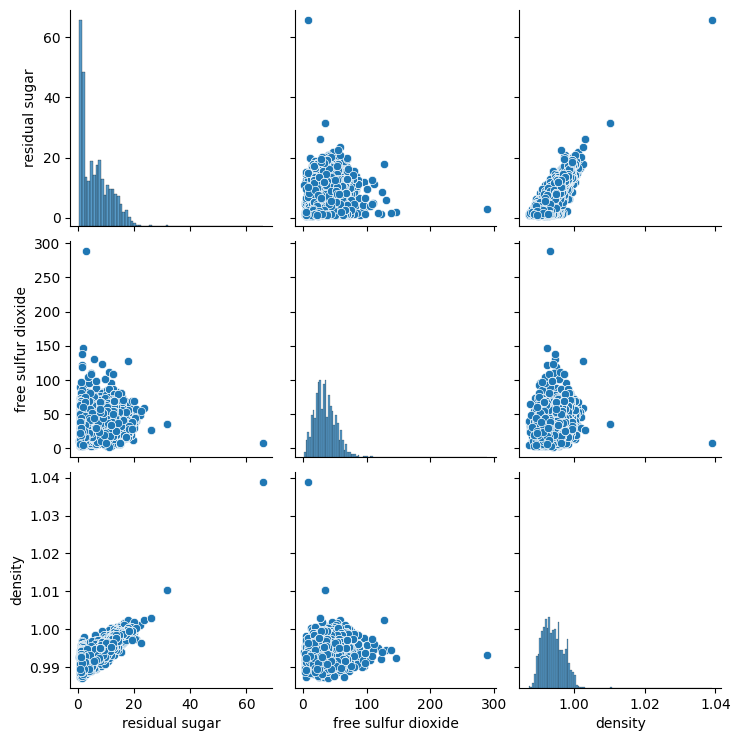

In [10]:
sns.pairplot(data[high_corr], palette='bright');

# 2. Простейшие методы - 3 Сигмы

In [11]:
# выделим признаки из данных
data_features = data.iloc[:, :-1]
data_features

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9
...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8


In [12]:
# Нормализация значений признаков (необязательно, но желательно!)
from sklearn.preprocessing import MinMaxScaler
X_data = MinMaxScaler().fit_transform(data_features.iloc[:, :-1])
Y_data = data.iloc[:, -1]
#X_data = data_features.iloc[:, :-1]

In [13]:
Y_data

0       6
1       6
2       6
3       6
4       6
       ..
4893    6
4894    5
4895    6
4896    7
4897    6
Name: quality, Length: 4898, dtype: int64

In [14]:
sigma_outliers = []
for i in range(3, 4): # возможность тестирования для различных кратных значений сигма
    up_bound = X_data.mean(axis=0) + i * X_data.std(axis=0)
    low_bound = X_data.mean(axis=0) - i * X_data.std(axis=0)
    sigma_outliers.append(np.where((X_data < low_bound) | (X_data > up_bound), 1, 0).any(axis=1).astype('int8'))

In [15]:
# Подсчет количества и процента выбросов для разных сигм
sum_list = np.array(sigma_outliers).sum(axis=1)
mean_list = np.array(sigma_outliers).mean(axis=1)

In [16]:
# Сохраняем значения для отклонения с наименьшим процентом выбросов
sigma_outliers = np.array(sigma_outliers)[sum_list.argmin()]

# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке для {} сигм: {}'.format(sum_list.argmin() + 3, sum_list.min()))
print('Процент выбросов в выборке для {} сигм: {:.2%}'.format(mean_list.argmin() + 3, mean_list.min()))

Количество выбросов в выборке для 3 сигм: 396
Процент выбросов в выборке для 3 сигм: 8.08%


In [17]:
data_features.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [69]:
sigma=pd.DataFrame(columns=['upper_bound',	'lower_bound',	'anomalies_count',	'anomalies_percentage'])
threshold = 3
for col in data_features.columns:
  up_bound = data_features[col].mean() + threshold * data_features[col].std()
  low_bound = data_features[col].mean() - threshold * data_features[col].std()
  anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).sum(axis=1)>=1
  sigma.loc[col] = [up_bound, low_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]


In [70]:
sigma

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
fixed acidity,9.386392,4.323183,46.0,0.939159
volatile acidity,0.580625,-0.024143,81.0,1.653736
citric acid,0.697251,-0.028868,85.0,1.735402
residual sugar,21.607588,-8.824758,9.0,0.183748
chlorides,0.111316,-0.019772,102.0,2.082483
free sulfur dioxide,86.329497,-15.713327,32.0,0.653328
total sulfur dioxide,265.854851,10.866464,12.0,0.244998
density,1.003000,0.985055,3.0,0.061249
pH,3.641268,2.735265,32.0,0.653328
sulphates,0.832224,0.147469,48.0,0.979992


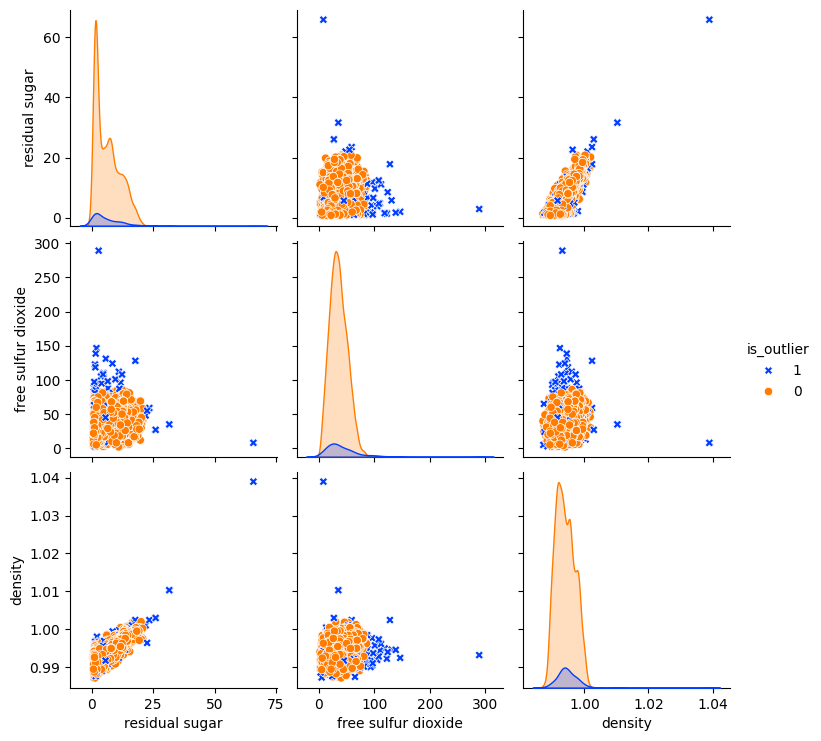

In [21]:
labeled_data = data_features[high_corr].copy()
labeled_data['is_outlier'] = sigma_outliers

sns.pairplot(data=labeled_data, vars = high_corr,
             hue='is_outlier', hue_order=[1, 0],
             markers=['o', 'X'],  palette='bright');

## <center> Межквартильное отклонение</center>

**Кванти́ль**  - значение, которое заданная случайная величина не превышает с фиксированной вероятностью. Если вероятность задана в процентах, то квантиль называется **процентилем** или **перцентилем**.


*   **0,25-квантиль** называется первым (или нижним) кварти́лем;

*   **0,5-квантиль** называется медианой;

*   **0,75-квантиль** называется третьим (или верхним) кварти́лем.


## <center> Box Plot (ящик с усами)</center>

Границами ящика служат первый и третий квартили (25-й и 75-й пeрцентиль соответственно), линия в середине ящика — медиана (50-й процентиль). Концы усов — края статистически значимой выборки (без выбросов), и они могут определяться несколькими способами. Наиболее распространённые значения, определяющие длину «усов»:

*   Минимальное и максимальное наблюдаемые значения данных по выборке (в этом случае выбросы отсутствуют);
*   Разность первого квартиля и полутора межквартильных расстояний; сумма третьего квартиля и полутора межквартильных расстояний.

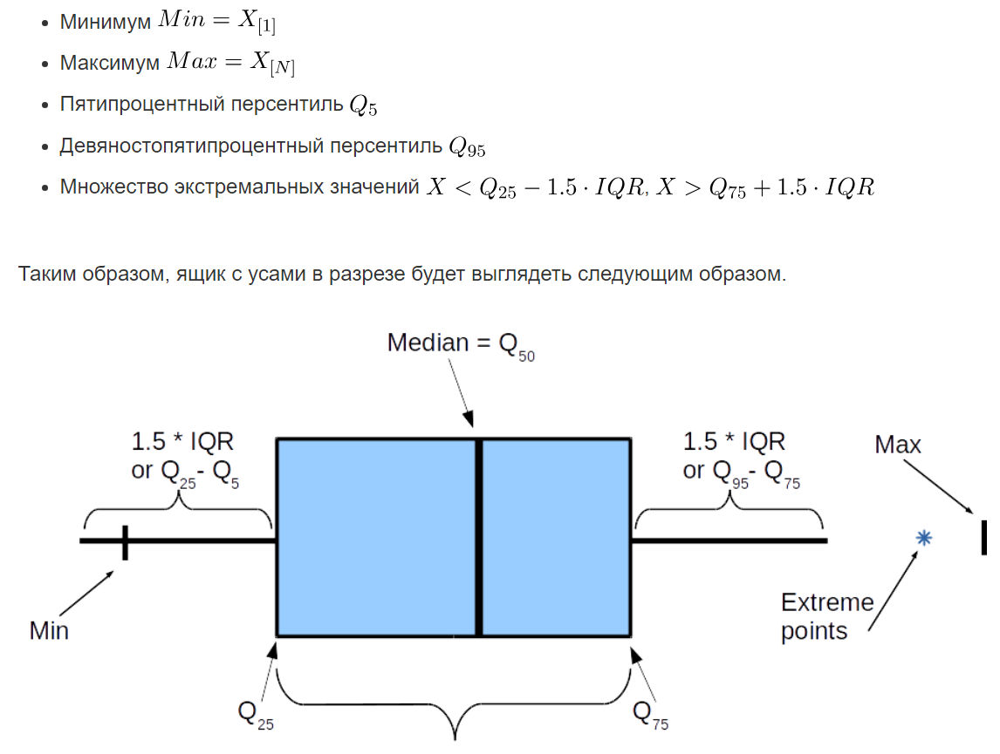

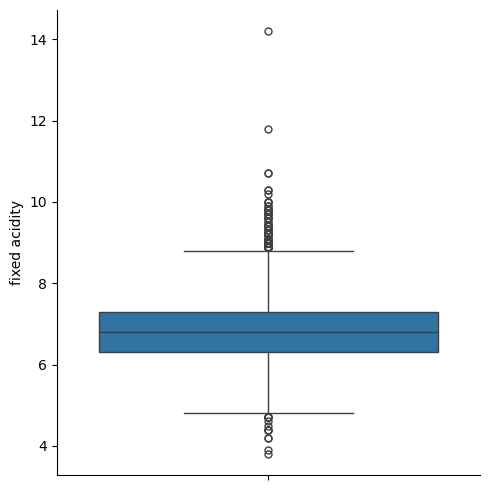

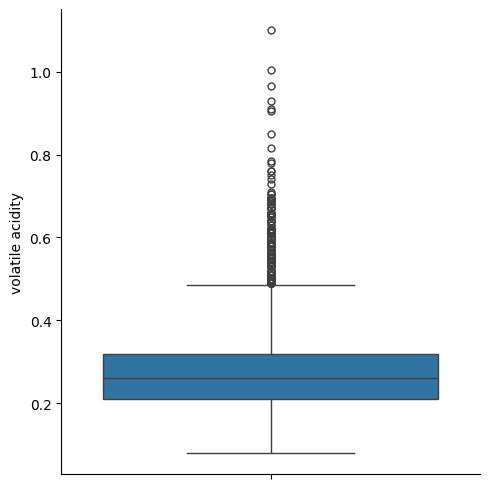

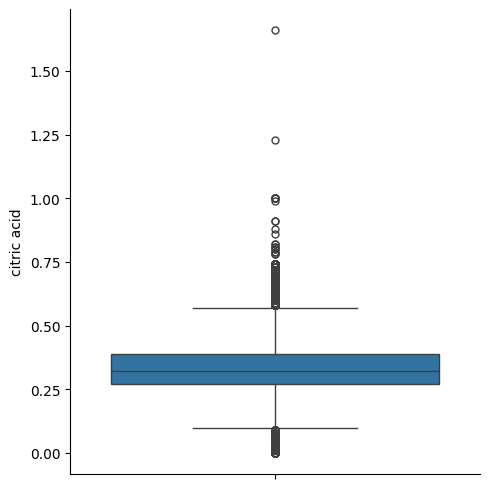

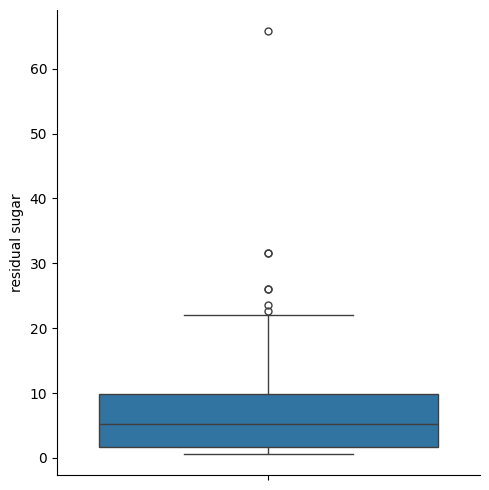

...

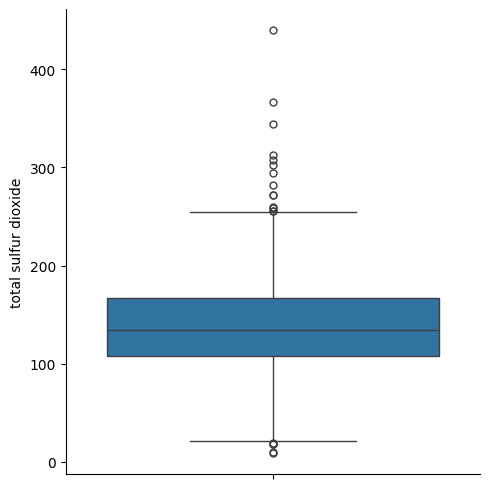

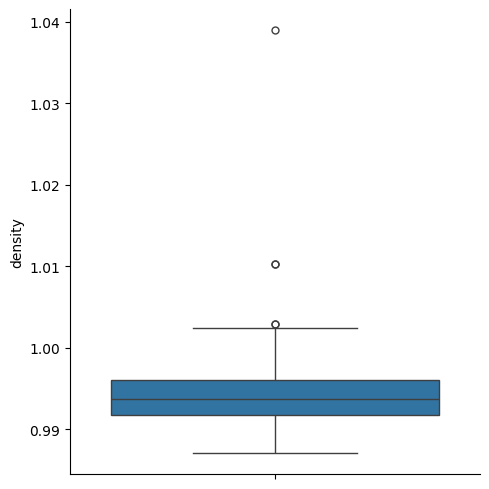

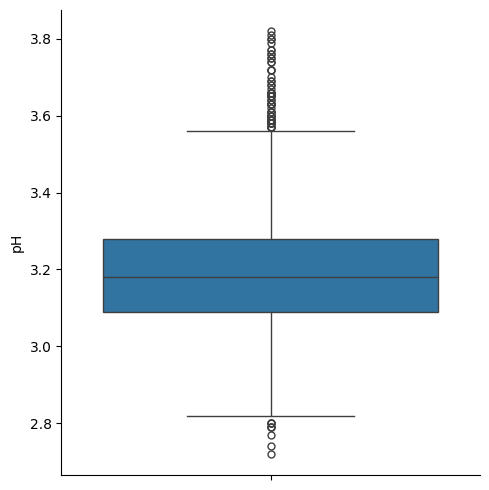

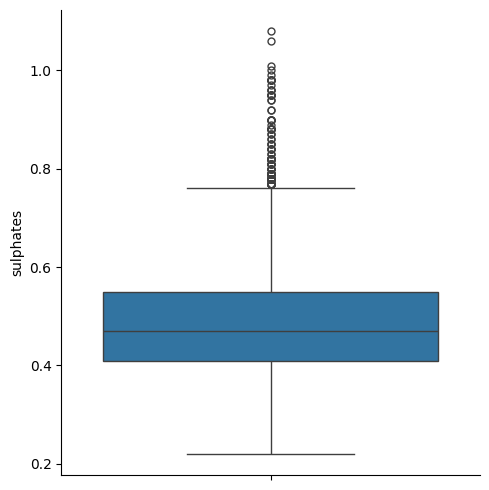

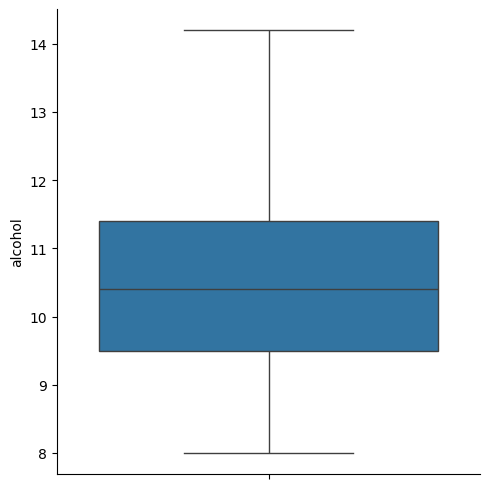

In [22]:
for col in data_features.columns:
  sns.catplot(data=data_features[col], kind="box")

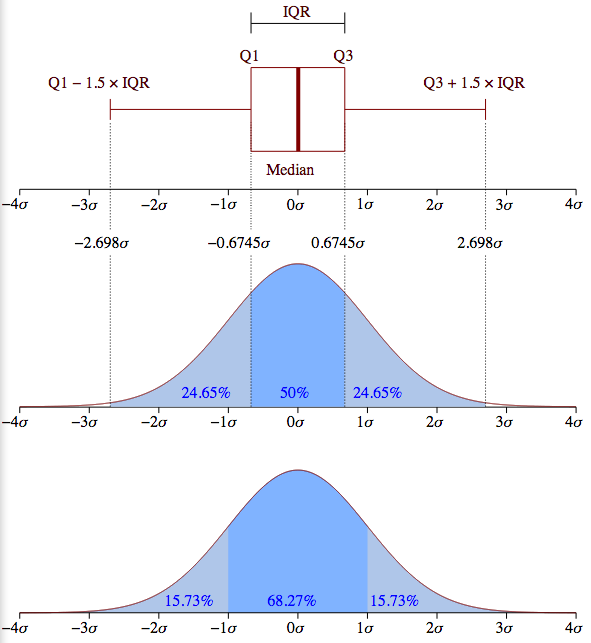

In [23]:
box=pd.DataFrame(columns=['upper_bound',	'lower_bound',	'anomalies_count',	'anomalies_percentage'])
threshold=1.5 #
for col in data_features.columns:
    IQR = data_features[col].quantile(0.75) - data_features[col].quantile(0.25)
    up_bound = data_features[col].quantile(0.75) + (IQR * threshold)
    low_bound = data_features[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data_features[col]>up_bound, data_features[col]<low_bound], axis=1).sum(axis=1)>=1
    box.loc[col] = [up_bound, low_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]

In [24]:
# отслеживаем аномалии по точкам
data_anom =pd.DataFrame(columns = data_features.columns)
for col in data_features.columns:
  IQR = data_features[col].quantile(0.75) - data_features[col].quantile(0.25)
  up_bound = data_features[col].quantile(0.75) + (IQR * threshold)
  low_bound = data_features[col].quantile(0.25) - (IQR * threshold)
  data_anom[col] = pd.concat([data_features[col]>up_bound, data_features[col]<low_bound], axis=1).sum(axis=1)>=1

In [25]:
# Это аномалии, НО! Они дублируются
data_anom.sum(axis=0)

fixed acidity           119
volatile acidity        186
citric acid             270
residual sugar            7
chlorides               208
free sulfur dioxide      50
total sulfur dioxide     19
density                   5
pH                       75
sulphates               124
alcohol                   0
dtype: int64

In [26]:
# а вот так уже без перекрытий
data_anom.sum(axis=1)>0

0       False
1       False
2       False
3       False
4       False
        ...  
4893    False
4894    False
4895    False
4896    False
4897    False
Length: 4898, dtype: bool

In [27]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(data_anom.sum(axis=1)>0)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(data_anom.sum(axis=1)>0)/len(data)))

Количество выбросов в выборке: 883
Процент выбросов в выборке: 18.03%


In [28]:
iqr_outliers = np.array([1 if label == True
                           else 0 for label in data_anom.sum(axis=1)>0])

# 3. Кластеризация


In [29]:
# Так как мы имеем дело с расстояниями - нужно убедиться, что все данные в одном масштабе
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features),
    columns=data_features.columns
)

## Hierarhical

In [30]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'ward')
cluster.fit_predict(scaled_data)

array([2, 0, 2, ..., 2, 0, 0])

In [31]:
cluster.n_clusters_

4

In [32]:
dis = (pd.DataFrame(cluster.children_)[1] - pd.DataFrame(cluster.children_)[0]).sort_values(ascending = False)

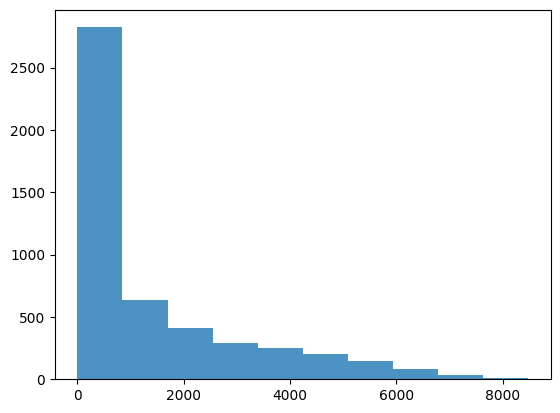

In [33]:
plt.hist(dis, alpha=0.8, bins =10);

In [34]:
np.unique(cluster.labels_, return_counts= True )


(array([0, 1, 2, 3]), array([2116,  744, 1951,   87]))

In [35]:
np.argmin(np.unique(cluster.labels_, return_counts= True)[1])

3

In [36]:
hier_outliers = np.array([1 if label == np.argmin(np.unique(cluster.labels_, return_counts= True)[1])
                           else 0 for label in cluster.labels_])

In [37]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(hier_outliers)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(hier_outliers)/len(data)))

Количество выбросов в выборке: 87
Процент выбросов в выборке: 1.78%


## <center> Distance-based (t-SNE)</center>

In [38]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

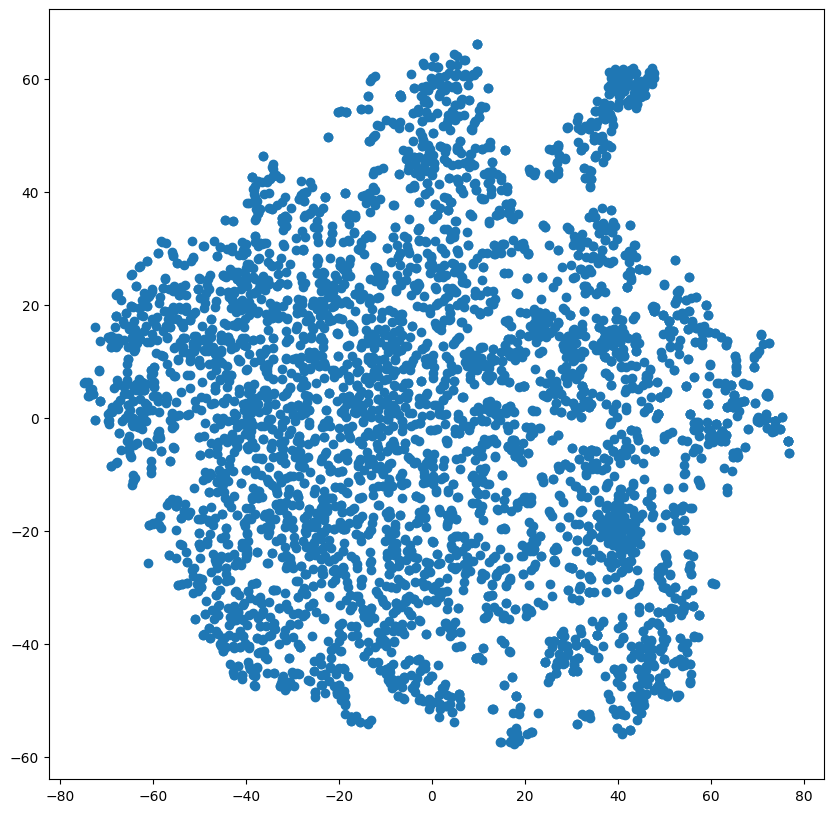

In [39]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=50, n_jobs=-1) # количество главных компонент, количество ближайших соседей, -1 - оличество параллельных заданий для запуска поиска соседей
tsne_transformed = tsne.fit_transform(scaled_data)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1]);

In [40]:
class DistanceOutliers(BaseEstimator):
    """
    Parameters:
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile

    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)

    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [41]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=95)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)

In [42]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(euclidian_outliers)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(euclidian_outliers)/len(data)))

Количество выбросов в выборке: 244
Процент выбросов в выборке: 4.98%


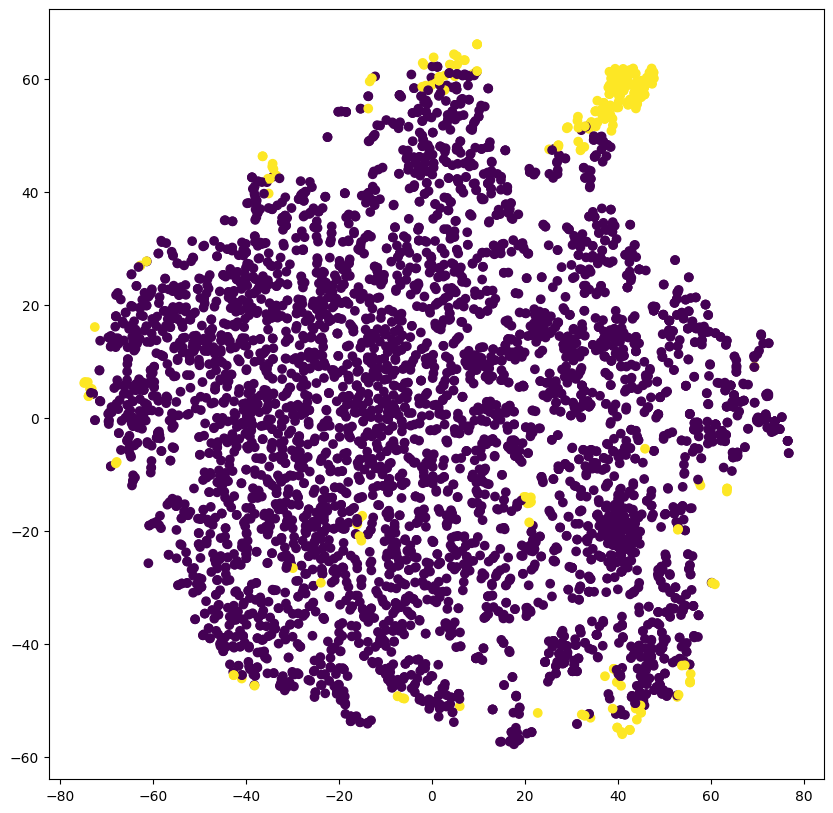

In [43]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

In [44]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=95)
citiblock_model.fit(scaled_data)
cityblock_outliers = citiblock_model.predict(scaled_data)

labeled_data = data_features.copy()
labeled_data['is_outlier'] = cityblock_outliers

In [45]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(cityblock_outliers)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(cityblock_outliers)/len(data)))

Количество выбросов в выборке: 245
Процент выбросов в выборке: 5.00%


# <center> Density-based </center>

## <center>DBSCAN</center>

https://www.naftaliharris.com/blog/visualizing-dbscan-clustering/


<img src="https://upload.wikimedia.org/wikipedia/commons/a/af/DBSCAN-Illustration.svg" width=500>

**Алгоритм:**
- 1. Выбираем случайную точку и находим её соседей в заданной
окрестности
- 2. Если соседей меньше критического значения – называем выбросами
- 3. Если нет – объединяем в «плотный» кластер и повторяем поиск соседей
- 4. Если все плотные точки пройдены и помечены как посещенные – выбираем новую не посещенную точку и начинаем сначала

Повторяем, пока все точки не будут посещены


**Преимущества:**
- Density-based (плотностной/вероятностный) метод – умеет в сложные формы кластеров
- Поиск выбросов и аномалий в данных

**Недостатки:**
- Довольно сложный в настройке – очень чувствителен к параметру ”плотности” epsilon

Идея - аномалии должны сильно отличаться от основных данных и скорее всего попадут в "шум". Почему бы не увеличивать epsilon до тех пор, пока все "плотные" данные не окажутся в нескольких немногочисленных кластерах, а шума будет столько, сколько мы подозреваем должно быть аномалий

In [46]:
from sklearn.cluster import DBSCAN

# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.05
eps_history = [eps]
while outlier_percentage>0.1:
    model = DBSCAN(eps=eps).fit(scaled_data)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)

model = DBSCAN(eps)
model.fit(scaled_data)
density_outliers = np.array([1 if label == -1 else 0 for label in model.labels_])

In [47]:
eps_history

[0.05,
 0.1,
 0.15000000000000002,
 0.2,
 0.25,
 0.3,
 0.35,
 0.39999999999999997,
 0.44999999999999996,
 0.49999999999999994,
 0.5499999999999999,
 0.6,
 0.65,
 0.7000000000000001,
 0.7500000000000001,
 0.8000000000000002,
 0.8500000000000002,
 0.9000000000000002,
 0.9500000000000003,
 1.0000000000000002,
 1.0500000000000003,
 1.1000000000000003,
 1.1500000000000004,
 1.2000000000000004,
 1.2500000000000004,
 1.3000000000000005,
 1.3500000000000005,
 1.4000000000000006,
 1.4500000000000006,
 1.5000000000000007,
 1.5500000000000007]

In [48]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(density_outliers)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(density_outliers)/len(data)))

Количество выбросов в выборке: 381
Процент выбросов в выборке: 7.78%


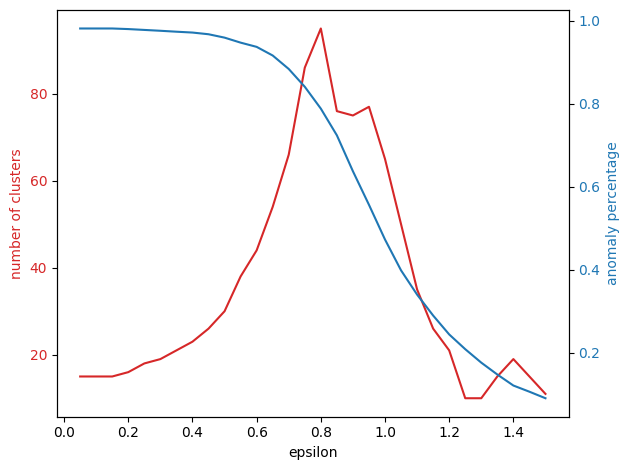

In [49]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('epsilon')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.show()

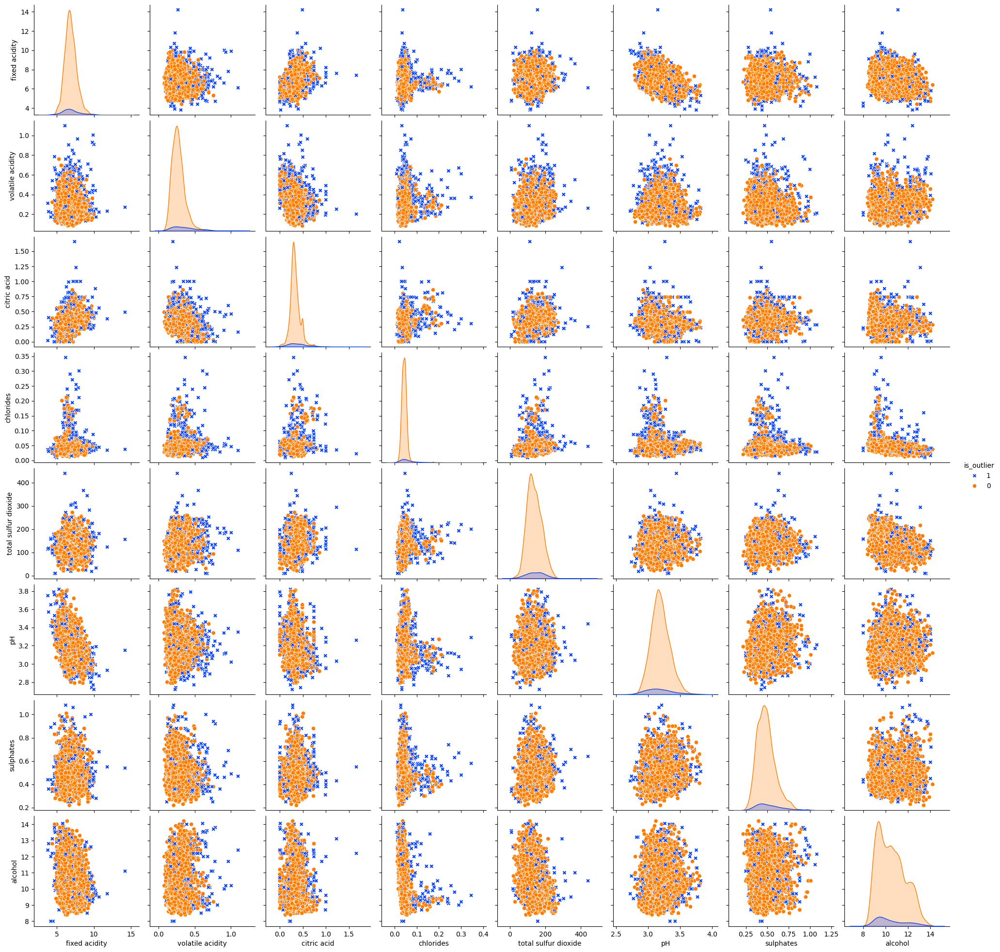

In [50]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['o', 'X'],  palette='bright');

# Unsupervised model-based

## One-Class SVM (Support Vector Machine )

In [51]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.05, gamma='auto') # nu - Верхняя граница доли ошибок обучения и нижняя граница доли опорных векторов.
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [52]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(svm_outliers)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(svm_outliers )/len(data)))

Количество выбросов в выборке: 249
Процент выбросов в выборке: 5.08%


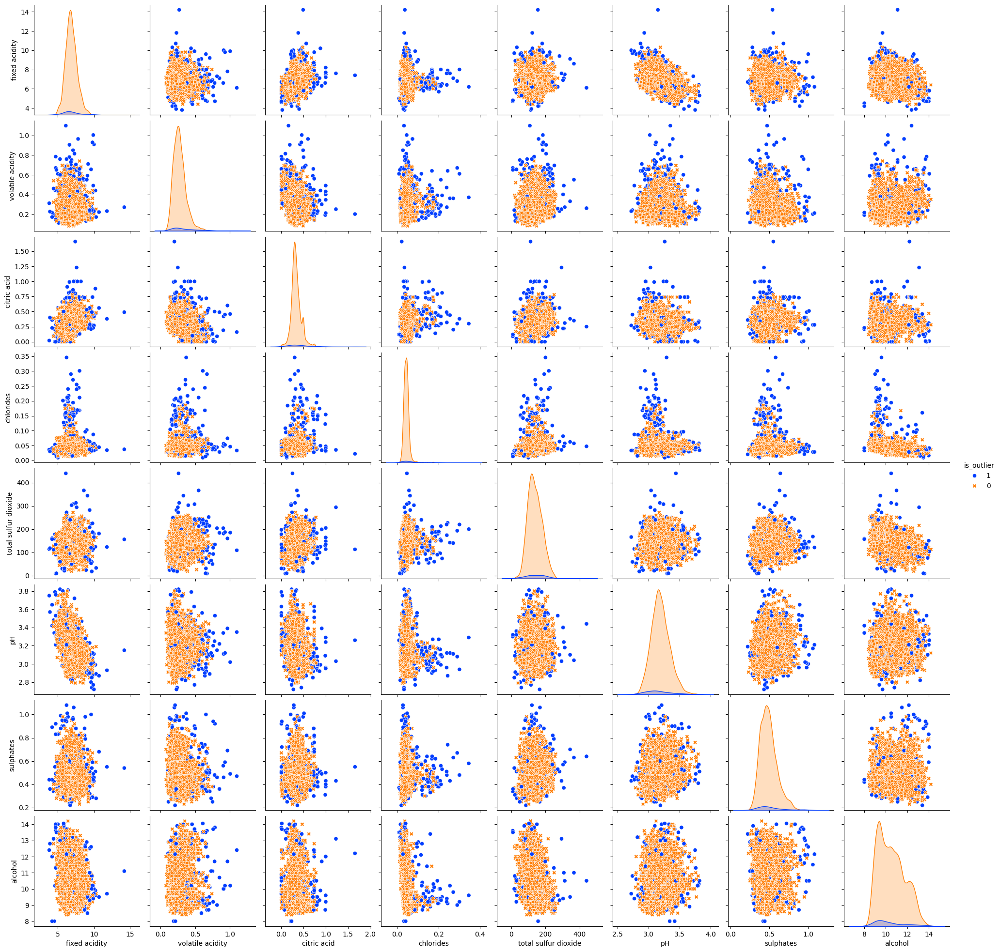

In [53]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = svm_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

## Плюсы и минусы

\+ Благодаря kernel trick, модель способна проводить **нелинейные разделяющие границы**

\+ Особенно удобно использовать, когда в данных недостаточно "плохих" наблюдений, чтобы использовать стандартный подход обучения с учителем - бинарную классификацию

\- Необходимо заранее знать процент аномалий в данных (гиперпараметр `nu`)

\- Может очень сильно **переобучиться** и выдавать большое количество ложно отрицательных результатов, если разделяющий зазор слишком мал

## <center> Isolation Forest </center>

Идея - давайте посмотрим, насколько легко можно "изолировать" наблюдение от всех остальных. Если слишком легко, наверное она лежит далеко и является выбросом. Если очень тяжело - скорее всего она похожа на кучу других точек и выбросом не является.


**Алгоритм:**
1. Выберите точку, которую нужно изолировать.
2. Для каждой фичи установите диапазон изоляции между минимальным и максимальным.
3. Выберите фичу случайным образом.
4. Выберите значение, которое находится в диапазоне, опять же случайным образом:
    - Если точка лежит выше выбранного значение, сдвиньте минимальный диапазон фичи на это значение.
    - Если точка лежит ниже, сдвиньте максимальное значение фичи на значение.
5. Повторите шаги 3 и 4, пока точка не будет изолирована. То есть до тех пор, пока точка не станет единственной, находящейся внутри диапазона для всех фичей.
6. Посчитайте, сколько раз вам пришлось повторить шаги 3 и 4.

https://quantdare.com/isolation-forest-algorithm/

In [54]:
from sklearn.ensemble import IsolationForest
isolation_forest = IsolationForest(n_estimators=100, contamination=0.05,
                                   max_features=1.0, bootstrap=True)
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [55]:
# Вывод информации по аномальным транзакциям и выбросам
print('Количество выбросов в выборке: {}'.format(sum(isolation_outliers)))
print('Процент выбросов в выборке: {:.2%}'.format(sum(isolation_outliers)/len(data)))

Количество выбросов в выборке: 245
Процент выбросов в выборке: 5.00%


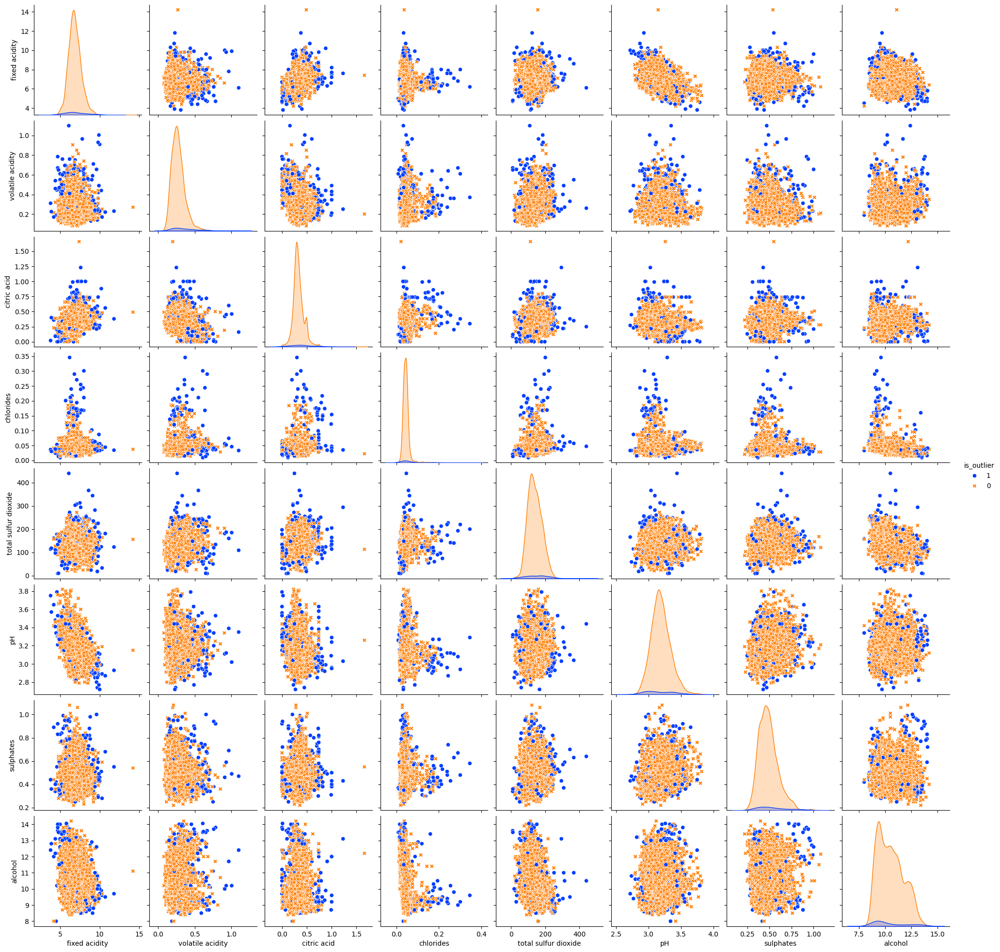

In [56]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = isolation_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['X', 'o'],  palette='bright');

## Плюсы и минусы

\+ Снова **нелинейные разделяющие границы**, интуитивно понятные принципы работы

\+ Снова удобно использовать, когда не можем в бинарную классификацию

\- Довольно сложная настройка параметров, которую тяжело проводить, не имея хотя бы минимальной разметки или предположения о количестве "грязных" наблюдений - параметр `contamination`

# Финальное сравнение

In [72]:
summary = np.concatenate((
    [sigma_outliers],
    [iqr_outliers],
    [hier_outliers],
    [euclidian_outliers],
    [cityblock_outliers],
    [density_outliers],
    [svm_outliers],
    [isolation_outliers]
))

In [58]:
summary = pd.DataFrame(
    summary.T,
    columns=['sigma', 'iqr', 'hierarhical', 'euclid', 'cityblock', 'dbscan', 'svm', 'isolation']
)
summary.head()

,sigma,iqr,hierarhical,euclid,cityblock,dbscan,svm,isolation
0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0


In [83]:
summary.sum(axis=1)

array([396, 883,  87, 244, 245, 381, 249, 245])

In [59]:
summary.sum(axis=1).value_counts()

0    3920
1     422
2     171
3     113
7      80
5      71
6      48
4      40
8      33
Name: count, dtype: int64

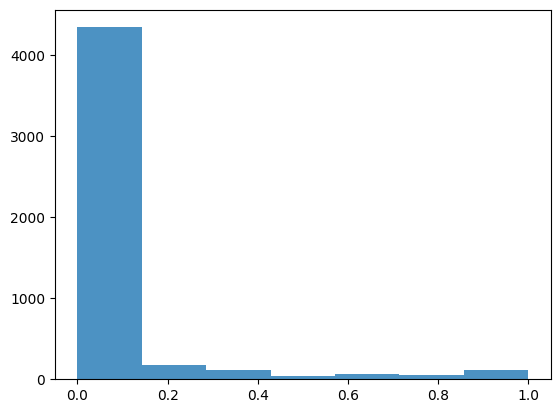

In [60]:
outlier_score = summary.mean(axis=1)
plt.hist(outlier_score, alpha=0.8, bins =7);

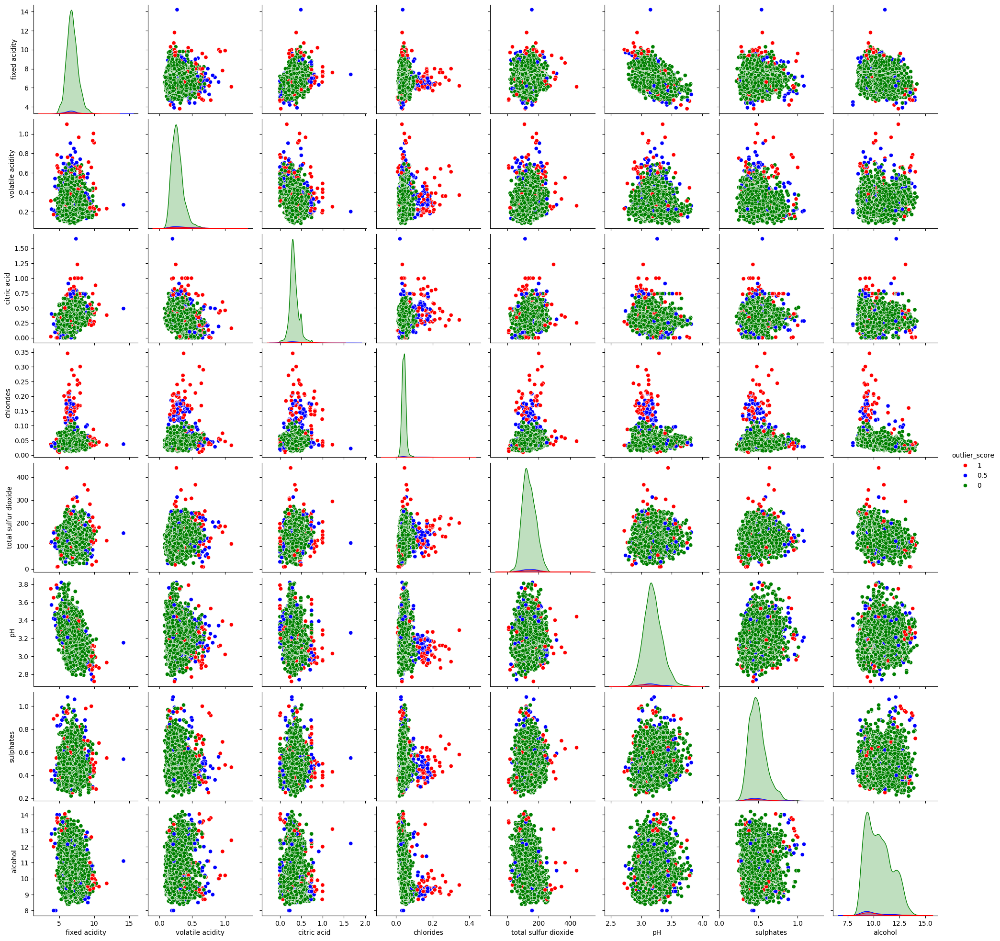

In [61]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
labeled_data['outlier_score'] = simple_score

custom_palette = {0:'g', 0.5:'b', 1.0:'r'}

sns.pairplot(data=labeled_data, vars=other_features,
             hue='outlier_score',
             hue_order=[1, 0.5, 0],
             palette=custom_palette
)

0    4389
1     272
3     129
2     108
Name: count, dtype: int64

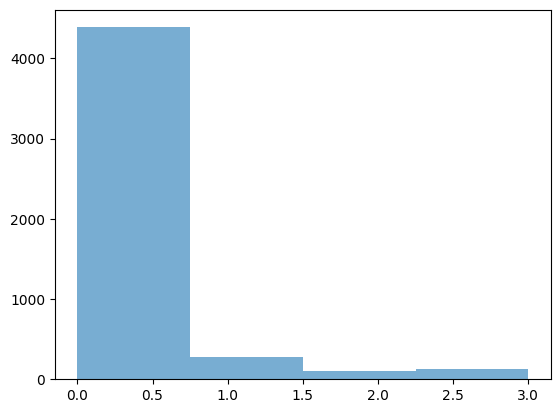

In [62]:
outliers_score_model_based = summary[['dbscan', 'svm', 'isolation']].sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6, bins=4);
outliers_score_model_based.value_counts()

https://hands-on.cloud/anomaly-detection-python-example/